In [1]:
import opendatasets as od
import pandas as pd
import os
import zipfile
import matplotlib.pyplot as plt
from matplotlib.image import imread
import random

from os import listdir
import shutil
import numpy as np
import keras.preprocessing.image as kerasImg
import keras.layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras import ops

2024-08-25 21:09:50.991902: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-08-25 21:09:50.995365: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-08-25 21:09:51.005671: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-25 21:09:51.021599: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-25 21:09:51.026352: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-08-25 21:09:51.038943: I tensorflow/core/platform/cpu_feature_gu

In [2]:
if not (os.path.isdir('dogs-vs-cats')):
    od.download("https://www.kaggle.com/datasets/agungpambudi/mnist-multiple-dataset-comprehensive-analysis/data") 
else:
    with zipfile.ZipFile('dogs-vs-cats/train.zip', 'r') as zip_ref:
        zip_ref.extractall('../Scripts/dogs-vs-cats')
    with zipfile.ZipFile('dogs-vs-cats/test1.zip', 'r') as zip_ref:
        zip_ref.extractall('../Scripts/dogs-vs-cats')


Skipping, found downloaded files in "./mnist-multiple-dataset-comprehensive-analysis" (use force=True to force download)


In [3]:
folder = "Scripts/polymnist/"
subdirs = ['train/', 'test/']
labeldirs = ['ceros/', 'unos/', 'dos/', 'tres/', 'cuatros/', 'cincos/', 'seis/', 'siete/', 'ocho/', 'nueve/']

In [4]:
for subdir in subdirs:
 # create label subdirectories
    for labldir in labeldirs:
        newdir = folder + subdir + labldir
        os.makedirs(newdir, exist_ok=True)

random.seed(1)
# define ratio of pictures to use for validation
val_ratio = 0.25
src_directory = 'mnist-multiple-dataset-comprehensive-analysis/PolyMNIST/MMNIST/'

for tempDir in os.listdir(src_directory):
    for tempDir2 in os.listdir(src_directory + tempDir):
        for file in os.listdir(src_directory+tempDir+'/'+tempDir2):
            dst = ''
            dst_dir = folder+tempDir+'/'
            if file.endswith('0.png'):
                dst_dir = dst_dir+'ceros/'
                dst = dst_dir + file
            elif file.endswith('1.png'):
                dst_dir = dst_dir+'unos/'
                dst = dst_dir + file
            elif file.endswith('2.png'):
                dst_dir = dst_dir+'dos/'
                dst = dst_dir + file
            elif file.endswith('3.png'):
                dst_dir = dst_dir+'tres/'
                dst = dst_dir + file
            elif file.endswith('4.png'):
                dst_dir = dst_dir+'cuatros/'
                dst = dst_dir + file  
            elif file.endswith('5.png'):
                dst_dir = dst_dir+'cincos/'
                dst = dst_dir + file
            elif file.endswith('6.png'):
                dst_dir = dst_dir+'seis/'
                dst = dst_dir + file
            elif file.endswith('7.png'):
                dst_dir = dst_dir+'siete/'
                dst = dst_dir + file
            elif file.endswith('8.png'):
                dst_dir = dst_dir+'ocho/'
                dst = dst_dir + file
            elif file.endswith('9.png'):
                dst_dir = dst_dir+'nueve/'
                dst = dst_dir + file
            try:
                print(dst)
                shutil.copy2(src_directory+tempDir+'/'+tempDir2+'/'+file, dst)
            except PermissionError as e:
                print(f"Error de permisos al copiar {file}: {e}")
            except Exception as e:
                print(f"Ocurrió un error al copiar {file}: {e}")

Scripts/polymnist/test/ceros/0.0.png
Scripts/polymnist/test/unos/0.1.png
Scripts/polymnist/test/dos/0.2.png
Scripts/polymnist/test/tres/0.3.png
Scripts/polymnist/test/cuatros/0.4.png
Scripts/polymnist/test/cincos/0.5.png
Scripts/polymnist/test/seis/0.6.png
Scripts/polymnist/test/siete/0.7.png
Scripts/polymnist/test/ocho/0.8.png
Scripts/polymnist/test/nueve/0.9.png
Scripts/polymnist/test/ceros/1.0.png
Scripts/polymnist/test/unos/1.1.png
Scripts/polymnist/test/dos/1.2.png
Scripts/polymnist/test/tres/1.3.png
Scripts/polymnist/test/cuatros/1.4.png
Scripts/polymnist/test/cincos/1.5.png
Scripts/polymnist/test/seis/1.6.png
Scripts/polymnist/test/siete/1.7.png
Scripts/polymnist/test/ocho/1.8.png
Scripts/polymnist/test/nueve/1.9.png
Scripts/polymnist/test/ceros/10.0.png
Scripts/polymnist/test/unos/10.1.png
Scripts/polymnist/test/dos/10.2.png
Scripts/polymnist/test/tres/10.3.png
Scripts/polymnist/test/cuatros/10.4.png
Scripts/polymnist/test/cincos/10.5.png
Scripts/polymnist/test/seis/10.6.png
Sc

In [5]:
fotos_train = []
fotos_test = []
etiquetas_train = []
etiquetas_test = []

#Train
for dir in labeldirs:
    for file in os.listdir(folder+subdirs[0]+dir):
        etiqueta = 0
        if file.endswith('1.png'):
            etiqueta = 1

        elif file.endswith('2.png'):
            etiqueta = 2

        elif file.endswith('3.png'):
            etiqueta = 3

        elif file.endswith('4.png'):
            etiqueta = 4

        elif file.endswith('5.png'):
            etiqueta = 5

        elif file.endswith('6.png'):
            etiqueta = 6

        elif file.endswith('7.png'):
            etiqueta = 7

        elif file.endswith('8.png'):
            etiqueta = 8

        elif file.endswith('9.png'):
            etiqueta = 9

        imagen = kerasImg.load_img(folder+subdirs[0]+dir+file,target_size=(25,25))
        imagen = kerasImg.img_to_array(imagen)
        #convertir a arreglos de numpy
        fotos_train.append(imagen)
        etiquetas_train.append(etiqueta)
fotos_train = np.asarray(fotos_train)
etiquetas_train = np.asarray(etiquetas_train)
print(fotos_train.shape, etiquetas_train.shape)

(60000, 25, 25, 3) (60000,)


In [6]:
# np.save(folder+'numbers_photos.npy',fotos_train)
# np.save(folder+'numbers_labels.npy',etiquetas_train)

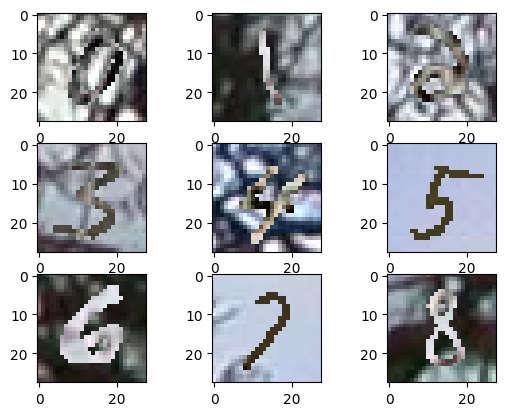

In [7]:
for i in range(9):
    plt.subplot(330+1+i)
    filename = 'mnist-multiple-dataset-comprehensive-analysis/PolyMNIST/MMNIST/test/m0/'+'0.'+str(i)+'.png'
    # print(filename)
    image = imread(filename)
    plt.imshow(image)

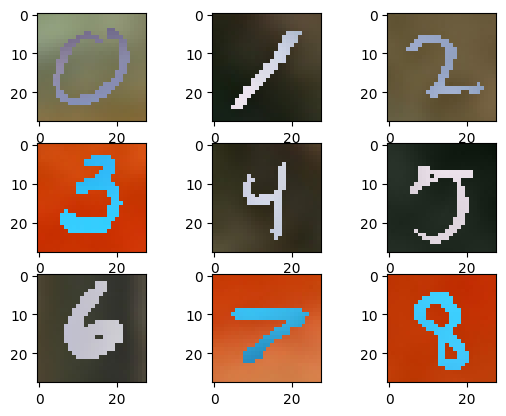

In [8]:
for i in range(9):
    plt.subplot(330+1+i)
    filename = 'mnist-multiple-dataset-comprehensive-analysis/PolyMNIST/MMNIST/test/m1/'+'0.'+str(i)+'.png'
    # print(filename)
    image = imread(filename)
    plt.imshow(image)

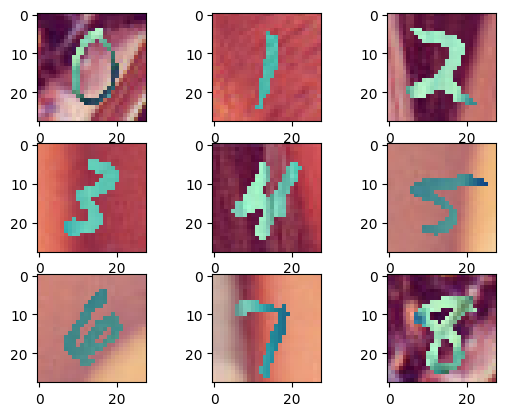

In [9]:
for i in range(9):
    plt.subplot(330+1+i)
    filename = 'mnist-multiple-dataset-comprehensive-analysis/PolyMNIST/MMNIST/test/m2/'+'0.'+str(i)+'.png'
    # print(filename)
    image = imread(filename)
    plt.imshow(image)

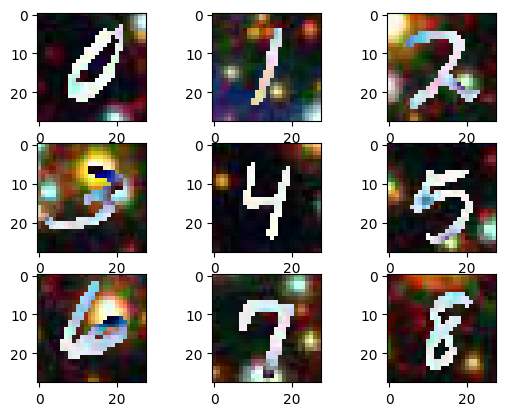

In [10]:
for i in range(9):
    plt.subplot(330+1+i)
    filename = 'mnist-multiple-dataset-comprehensive-analysis/PolyMNIST/MMNIST/test/m3/'+'0.'+str(i)+'.png'
    # print(filename)
    image = imread(filename)
    plt.imshow(image)

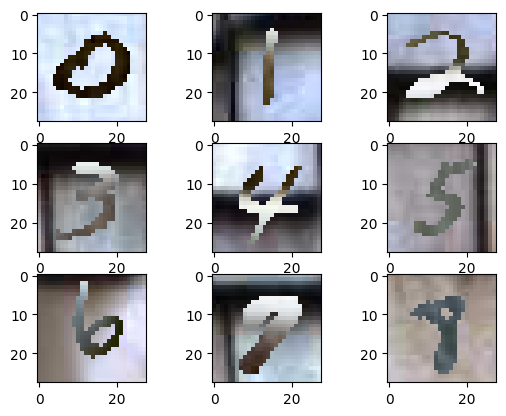

In [11]:
for i in range(9):
    plt.subplot(330+1+i)
    filename = 'mnist-multiple-dataset-comprehensive-analysis/PolyMNIST/MMNIST/test/m4/'+'0.'+str(i)+'.png'
    # print(filename)
    image = imread(filename)
    plt.imshow(image)

In [12]:
# fotos_train = np.load(folder+'numbers_photos.npy')
# etiquetas_trainlabels = np.load(folder+'numbers_labels.npy')
# print(fotos_train.shape, etiquetas_train.shape)

0 5923


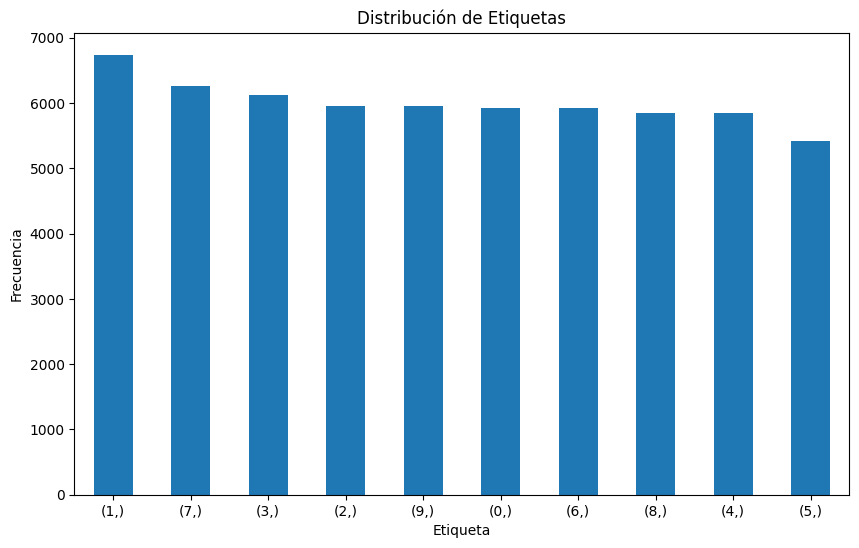

In [13]:
etiquetas_df = pd.DataFrame(etiquetas_train)
count_zeros = etiquetas_df[0].value_counts().get(0, 0)
print(f"0 {count_zeros}")
etiquetas_counts = etiquetas_df.value_counts()

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
etiquetas_counts.plot(kind='bar')
plt.title('Distribución de Etiquetas')
plt.xlabel('Etiqueta')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.show()

In [14]:
modelo1 = keras.Sequential()
modelo1.add(keras.layers.Conv2D(32,(3,3),activation='relu',kernel_initializer='he_uniform', padding='same', input_shape=(28, 28, 3)))
modelo1.add(keras.layers.MaxPooling2D((2,2)))
modelo1.add(keras.layers.Conv2D(64,(3,3),activation='relu',kernel_initializer='he_uniform', padding='same'))
modelo1.add(keras.layers.MaxPooling2D((2,2)))
modelo1.add(keras.layers.Conv2D(32,(3,3),activation='relu',kernel_initializer='he_uniform', padding='same'))
modelo1.add(keras.layers.MaxPooling2D((2,2)))
modelo1.add(keras.layers.Conv2D(16,(3,3),activation='relu',kernel_initializer='he_uniform', padding='same'))
modelo1.add(keras.layers.Flatten())
modelo1.add(keras.layers.Dense(16, activation='relu', kernel_initializer='he_uniform'))
modelo1.add(keras.layers.Dense(10, activation='softmax'))
opt = keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)
modelo1.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
modelo1.summary()

/home/darielvr/Desktop/UVG/Data/ConvolutionalNeuralNetwork-DataScience/.venv/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1724641863.062057     692 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-08-25 21:11:03.062681: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2343] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 28, 28, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 14, 14, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 7, 7, 32)       │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 3, 3, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 3, 3, 16)       │         4,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 144)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 16)             │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │           170 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 44,970 (175.66 KB)

 Trainable params: 44,970 (175.66 KB)

 Non-trainable params: 0 (0.00 B)

In [15]:
datagen = ImageDataGenerator(rescale=1.0/255.0)
train_it = datagen.flow_from_directory(folder+"train/", class_mode='categorical', batch_size=64, target_size=(28, 28))
test_it = datagen.flow_from_directory(folder+"test/", class_mode='categorical', batch_size=64, target_size=(28, 28))
history = modelo1.fit(train_it, steps_per_epoch=train_it.samples//train_it.batch_size,validation_data=test_it, validation_steps=test_it.samples//test_it.batch_size,epochs = 10,verbose = True )
modelo1.save(folder+'modelo1.keras')

Found 60000 images belonging to 10 classes.
Found 10000 images belonging to 10 classes.
Epoch 1/10
  1/937 ━━━━━━━━━━━━━━━━━━━━ 14:24 924ms/step - accuracy: 0.1562 - loss: 2.4493

/home/darielvr/Desktop/UVG/Data/ConvolutionalNeuralNetwork-DataScience/.venv/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


937/937 ━━━━━━━━━━━━━━━━━━━━ 19s 19ms/step - accuracy: 0.2263 - loss: 2.0494 - val_accuracy: 0.8135 - val_loss: 0.5561
Epoch 2/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 24us/step - accuracy: 0.7656 - loss: 0.6761 - val_accuracy: 0.8125 - val_loss: 0.4302
Epoch 3/10
  4/937 ━━━━━━━━━━━━━━━━━━━━ 15s 17ms/step - accuracy: 0.7591 - loss: 0.5966  

2024-08-25 21:11:23.966626: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
/usr/lib/python3.11/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)
2024-08-25 21:11:23.974153: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


937/937 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - accuracy: 0.8683 - loss: 0.3973 - val_accuracy: 0.9312 - val_loss: 0.2168
Epoch 4/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 18us/step - accuracy: 0.9219 - loss: 0.2685 - val_accuracy: 1.0000 - val_loss: 0.0399
Epoch 5/10
  4/937 ━━━━━━━━━━━━━━━━━━━━ 16s 18ms/step - accuracy: 0.9281 - loss: 0.2054  

2024-08-25 21:11:43.288957: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


937/937 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - accuracy: 0.9311 - loss: 0.2142 - val_accuracy: 0.9379 - val_loss: 0.1854
Epoch 6/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 17us/step - accuracy: 0.9375 - loss: 0.1117 - val_accuracy: 0.8750 - val_loss: 0.3915
Epoch 7/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - accuracy: 0.9486 - loss: 0.1588 - val_accuracy: 0.9572 - val_loss: 0.1309
Epoch 8/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 17us/step - accuracy: 0.9688 - loss: 0.0838 - val_accuracy: 0.8750 - val_loss: 0.1681
Epoch 9/10
  4/937 ━━━━━━━━━━━━━━━━━━━━ 16s 18ms/step - accuracy: 0.9652 - loss: 0.1010  

2024-08-25 21:12:21.111425: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


937/937 ━━━━━━━━━━━━━━━━━━━━ 19s 20ms/step - accuracy: 0.9589 - loss: 0.1269 - val_accuracy: 0.9583 - val_loss: 0.1281
Epoch 10/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 16us/step - accuracy: 0.9844 - loss: 0.0816 - val_accuracy: 0.9375 - val_loss: 0.1020


In [16]:
loss , acc = modelo1.evaluate(test_it, steps=len(test_it), verbose=1)
print('> %.3f' % (acc * 100.0))

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.9586 - loss: 0.1278
> 95.760


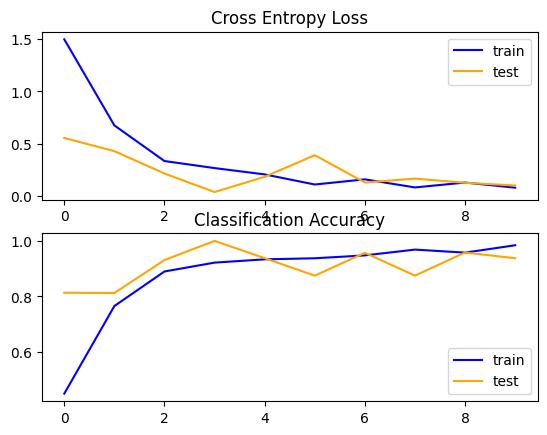

In [17]:
plt.subplot(211)
plt.title('Cross Entropy Loss')
plt.plot(history.history['loss'], color='blue', label='train')
plt.plot(history.history['val_loss'], color='orange', label='test')
plt.legend()
 # plot accuracy
plt.subplot(212)
plt.title('Classification Accuracy')
plt.plot(history.history['accuracy'], color='blue', label='train')
plt.plot(history.history['val_accuracy'], color='orange', label='test')
plt.legend()



In [18]:

modelo2 = keras.Sequential()
modelo2.add(keras.layers.Conv2D(64,(3,3),activation='relu',kernel_initializer='he_uniform',padding='same',input_shape=(28,28,3)))
modelo2.add(keras.layers.MaxPooling2D((2,2)))
modelo2.add(keras.layers.Dropout(0.2))
modelo2.add(keras.layers.Conv2D(128,(3,3),activation='relu',kernel_initializer='he_uniform',padding='same'))
modelo2.add(keras.layers.MaxPooling2D((2,2)))
modelo2.add(keras.layers.Dropout(0.2))
modelo2.add(keras.layers.Conv2D(64,(3,3),activation='relu',kernel_initializer='he_uniform',padding='same'))
modelo2.add(keras.layers.MaxPooling2D((2,2)))
modelo2.add(keras.layers.Dropout(0.2))
modelo2.add(keras.layers.Flatten())
modelo2.add(keras.layers.Dense(64,activation='relu',kernel_initializer='he_uniform'))
modelo2.add(keras.layers.Dense(10,activation='softmax'))
opt = keras.optimizers.SGD(learning_rate=0.001, momentum=0.9)
modelo2.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
modelo2.summary()



Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 28, 28, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 14, 14, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 7, 7, 64)       │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 3, 3, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 3, 3, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 576)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 187,018 (730.54 KB)

 Trainable params: 187,018 (730.54 KB)

 Non-trainable params: 0 (0.00 B)

In [19]:
history2 = modelo2.fit(train_it, steps_per_epoch=train_it.samples//train_it.batch_size,validation_data=test_it, validation_steps=test_it.samples//test_it.batch_size,epochs = 10,verbose = True )
modelo2.save(folder+'modelo2.keras')

Epoch 1/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 43s 45ms/step - accuracy: 0.1164 - loss: 2.3560 - val_accuracy: 0.2690 - val_loss: 2.1308
Epoch 2/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 24us/step - accuracy: 0.1719 - loss: 2.2139 - val_accuracy: 0.4375 - val_loss: 2.1414
Epoch 3/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - accuracy: 0.3304 - loss: 1.9147 - val_accuracy: 0.7042 - val_loss: 0.9838
Epoch 4/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 15us/step - accuracy: 0.6250 - loss: 0.9718 - val_accuracy: 0.6875 - val_loss: 1.3764
Epoch 5/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 38s 40ms/step - accuracy: 0.6596 - loss: 1.0145 - val_accuracy: 0.8178 - val_loss: 0.6059
Epoch 6/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 15us/step - accuracy: 0.8125 - loss: 0.5774 - val_accuracy: 0.8750 - val_loss: 0.6425
Epoch 7/10
  1/937 ━━━━━━━━━━━━━━━━━━━━ 1:55 123ms/step - accuracy: 0.7500 - loss: 0.6717

2024-08-25 21:14:44.704770: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


937/937 ━━━━━━━━━━━━━━━━━━━━ 38s 40ms/step - accuracy: 0.7766 - loss: 0.6923 - val_accuracy: 0.8714 - val_loss: 0.4368
Epoch 8/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 15us/step - accuracy: 0.8125 - loss: 0.5490 - val_accuracy: 0.8125 - val_loss: 0.4948
Epoch 9/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 38s 40ms/step - accuracy: 0.8193 - loss: 0.5602 - val_accuracy: 0.8968 - val_loss: 0.3501
Epoch 10/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 14us/step - accuracy: 0.8594 - loss: 0.4809 - val_accuracy: 0.6250 - val_loss: 0.8394


In [20]:
loss2 , acc2 = modelo2.evaluate(test_it, steps=len(test_it), verbose=1)
print('> %.3f' % (acc * 100.0))

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.8974 - loss: 0.3620
> 95.760


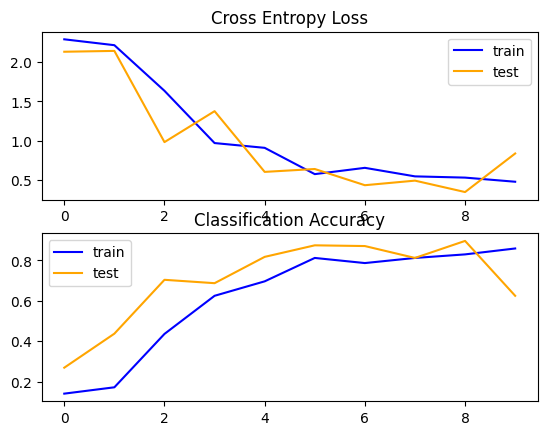

In [21]:
plt.subplot(211)
plt.title('Cross Entropy Loss')
plt.plot(history2.history['loss'], color='blue', label='train')
plt.plot(history2.history['val_loss'], color='orange', label='test')
plt.legend()
 # plot accuracy
plt.subplot(212)
plt.title('Classification Accuracy')
plt.plot(history2.history['accuracy'], color='blue', label='train')
plt.plot(history2.history['val_accuracy'], color='orange', label='test')
plt.legend()


In [22]:
cnnModelo = modelo1

if acc < acc2:
    cnnModelo = modelo2
    print("Se eligió el modelo 2")
else:
    print("Se eligió el modelo 1")

print("Modelo 1 Accuracy: ", acc)
print("Modelo 2 Accuracy: ", acc2)

Se eligió el modelo 1
Modelo 1 Accuracy:  0.9575999975204468
Modelo 2 Accuracy:  0.8952999711036682


In [23]:
train_datagen = ImageDataGenerator(rescale=1.0/255.0,width_shift_range=0.1, height_shift_range=0.1, horizontal_flip=True)
test_datagen = ImageDataGenerator(rescale=1.0/255.0)
train_it = train_datagen.flow_from_directory(folder+"train/", class_mode='categorical', batch_size=64, target_size=(28, 28))
test_it = test_datagen.flow_from_directory(folder+"test/", class_mode='categorical', batch_size=64, target_size=(28, 28))

Found 60000 images belonging to 10 classes.
Found 10000 images belonging to 10 classes.


In [24]:
modelo1Augmented = keras.Sequential()
modelo1Augmented.add(keras.layers.Conv2D(32,(3,3),activation='relu',kernel_initializer='he_uniform', padding='same', input_shape=(28, 28, 3)))
modelo1Augmented.add(keras.layers.MaxPooling2D((2,2)))
modelo1Augmented.add(keras.layers.Conv2D(64,(3,3),activation='relu',kernel_initializer='he_uniform', padding='same'))
modelo1Augmented.add(keras.layers.MaxPooling2D((2,2)))
modelo1Augmented.add(keras.layers.Conv2D(32,(3,3),activation='relu',kernel_initializer='he_uniform', padding='same'))
modelo1Augmented.add(keras.layers.MaxPooling2D((2,2)))
modelo1Augmented.add(keras.layers.Flatten())
modelo1Augmented.add(keras.layers.Dense(32, activation='relu', kernel_initializer='he_uniform'))
modelo1Augmented.add(keras.layers.Dense(10, activation='softmax'))
opt = keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)
modelo1Augmented.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
modelo1Augmented.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_7 (Conv2D)               │ (None, 28, 28, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 14, 14, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 7, 7, 32)       │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 3, 3, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 288)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 10)             │           330 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 47,434 (185.29 KB)

 Trainable params: 47,434 (185.29 KB)

 Non-trainable params: 0 (0.00 B)

In [25]:
historyAugmented = modelo1Augmented.fit(train_it, steps_per_epoch=train_it.samples//train_it.batch_size,validation_data=test_it, validation_steps=test_it.samples//test_it.batch_size,epochs = 10,verbose = True )

Epoch 1/10


/home/darielvr/Desktop/UVG/Data/ConvolutionalNeuralNetwork-DataScience/.venv/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


937/937 ━━━━━━━━━━━━━━━━━━━━ 34s 36ms/step - accuracy: 0.2045 - loss: 2.1158 - val_accuracy: 0.7212 - val_loss: 0.8480
Epoch 2/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 22us/step - accuracy: 0.6406 - loss: 0.9820 - val_accuracy: 0.7500 - val_loss: 0.7046
Epoch 3/10


/usr/lib/python3.11/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


937/937 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - accuracy: 0.7139 - loss: 0.8541 - val_accuracy: 0.8326 - val_loss: 0.4892
Epoch 4/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 13us/step - accuracy: 0.7188 - loss: 0.8762 - val_accuracy: 0.8125 - val_loss: 0.5068
Epoch 5/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - accuracy: 0.7993 - loss: 0.6013 - val_accuracy: 0.8785 - val_loss: 0.3555
Epoch 6/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 13us/step - accuracy: 0.7812 - loss: 0.5446 - val_accuracy: 1.0000 - val_loss: 0.1423
Epoch 7/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - accuracy: 0.8454 - loss: 0.4738 - val_accuracy: 0.8980 - val_loss: 0.3069
Epoch 8/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 13us/step - accuracy: 0.8281 - loss: 0.4892 - val_accuracy: 0.8750 - val_loss: 0.3042
Epoch 9/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - accuracy: 0.8712 - loss: 0.3991 - val_accuracy: 0.9072 - val_loss: 0.2928
Epoch 10/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 14us/step - accuracy: 0.8906 - loss: 0.3112 - val_accuracy: 

In [26]:
lossAugmented, accAugmented = modelo1Augmented.evaluate(test_it, steps=len(test_it), verbose=1)
print('> %.3f' % (acc * 100.0))

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.8882 - loss: 0.3501
> 95.760


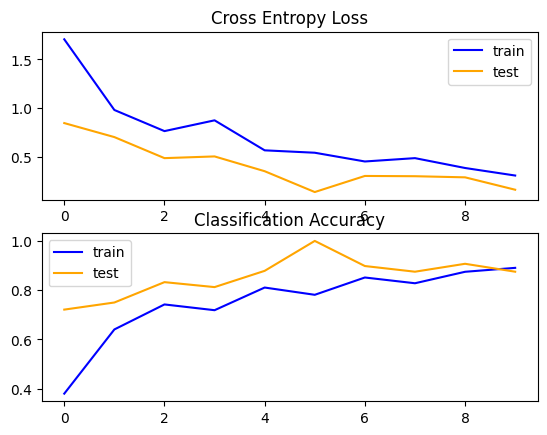

In [27]:
plt.subplot(211)
plt.title('Cross Entropy Loss')
plt.plot(historyAugmented.history['loss'], color='blue', label='train')
plt.plot(historyAugmented.history['val_loss'], color='orange', label='test')
plt.legend()
 # plot accuracy
plt.subplot(212)
plt.title('Classification Accuracy')
plt.plot(historyAugmented.history['accuracy'], color='blue', label='train')
plt.plot(historyAugmented.history['val_accuracy'], color='orange', label='test')
plt.legend()

In [28]:

modelo2Augmented = keras.Sequential()
modelo2Augmented.add(keras.layers.Conv2D(64,(3,3),activation='relu',kernel_initializer='he_uniform',padding='same',input_shape=(28,28,3)))
modelo2Augmented.add(keras.layers.MaxPooling2D((2,2)))
modelo2Augmented.add(keras.layers.Dropout(0.2))
modelo2Augmented.add(keras.layers.Conv2D(128,(3,3),activation='relu',kernel_initializer='he_uniform',padding='same'))
modelo2Augmented.add(keras.layers.MaxPooling2D((2,2)))
modelo2Augmented.add(keras.layers.Dropout(0.2))
modelo2Augmented.add(keras.layers.Conv2D(64,(3,3),activation='relu',kernel_initializer='he_uniform',padding='same'))
modelo2Augmented.add(keras.layers.MaxPooling2D((2,2)))
modelo2Augmented.add(keras.layers.Dropout(0.2))
modelo2Augmented.add(keras.layers.Flatten())
modelo2Augmented.add(keras.layers.Dense(64,activation='relu',kernel_initializer='he_uniform'))
modelo2Augmented.add(keras.layers.Dense(10,activation='softmax'))
opt = keras.optimizers.SGD(learning_rate=0.001, momentum=0.9)
modelo2Augmented.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
modelo2Augmented.summary()

/home/darielvr/Desktop/UVG/Data/ConvolutionalNeuralNetwork-DataScience/.venv/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)              │ (None, 28, 28, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 14, 14, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 7, 7, 64)       │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 3, 3, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 3, 3, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 576)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 64)             │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 187,018 (730.54 KB)

 Trainable params: 187,018 (730.54 KB)

 Non-trainable params: 0 (0.00 B)

In [29]:
history2Augmented = modelo2Augmented.fit(train_it, steps_per_epoch=train_it.samples//train_it.batch_size,validation_data=test_it, validation_steps=test_it.samples//test_it.batch_size,epochs = 10,verbose = True )

Epoch 1/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 43s 45ms/step - accuracy: 0.1066 - loss: 2.3645 - val_accuracy: 0.1258 - val_loss: 2.2952
Epoch 2/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 24us/step - accuracy: 0.0781 - loss: 2.3076 - val_accuracy: 0.1250 - val_loss: 2.2974
Epoch 3/10


2024-08-25 21:19:38.390950: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


937/937 ━━━━━━━━━━━━━━━━━━━━ 43s 45ms/step - accuracy: 0.1270 - loss: 2.2935 - val_accuracy: 0.2410 - val_loss: 2.1880
Epoch 4/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 14us/step - accuracy: 0.1250 - loss: 2.3160 - val_accuracy: 0.1250 - val_loss: 2.2681
Epoch 5/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 43s 46ms/step - accuracy: 0.2256 - loss: 2.1354 - val_accuracy: 0.4723 - val_loss: 1.5208
Epoch 6/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 15us/step - accuracy: 0.4531 - loss: 1.7002 - val_accuracy: 0.3750 - val_loss: 1.3525
Epoch 7/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 43s 46ms/step - accuracy: 0.4280 - loss: 1.6041 - val_accuracy: 0.6477 - val_loss: 1.1165
Epoch 8/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 15us/step - accuracy: 0.5312 - loss: 1.5715 - val_accuracy: 0.8125 - val_loss: 1.0557
Epoch 9/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 43s 46ms/step - accuracy: 0.5266 - loss: 1.3585 - val_accuracy: 0.7162 - val_loss: 0.9019
Epoch 10/10
937/937 ━━━━━━━━━━━━━━━━━━━━ 0s 16us/step - accuracy: 0.5000 - loss: 1.3255 - val_accuracy: 

In [30]:
loss2Augmented , acc2Augmented = modelo2Augmented.evaluate(test_it, steps=len(test_it), verbose=1)
print('> %.3f' % (acc * 100.0))

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.7135 - loss: 0.8994
> 95.760


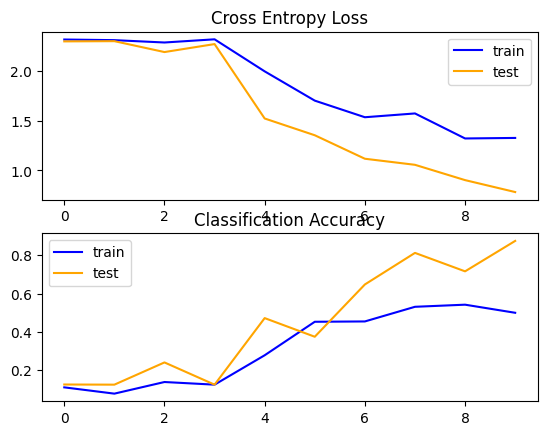

In [31]:
plt.subplot(211)
plt.title('Cross Entropy Loss')
plt.plot(history2Augmented.history['loss'], color='blue', label='train')
plt.plot(history2Augmented.history['val_loss'], color='orange', label='test')
plt.legend()
 # plot accuracy
plt.subplot(212)
plt.title('Classification Accuracy')
plt.plot(history2Augmented.history['accuracy'], color='blue', label='train')
plt.plot(history2Augmented.history['val_accuracy'], color='orange', label='test')
plt.legend()

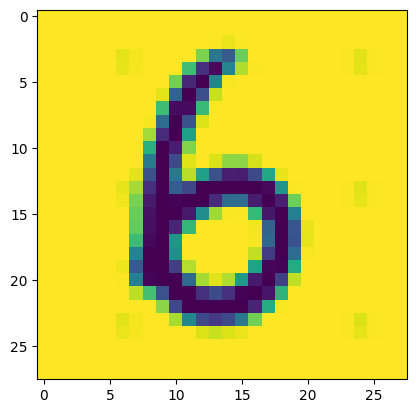

In [48]:
name = "handwrittenTest/6.png"
foto = imread(name)
plt.imshow(foto)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
[0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
Es un número 6


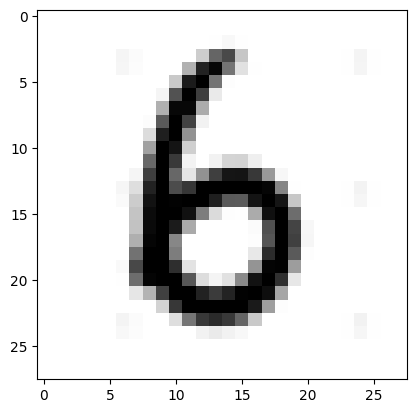

In [49]:
imagen = kerasImg.load_img(name,target_size=(28,28))
plt.imshow(imagen)
imagen = kerasImg.img_to_array(imagen)
imagen = imagen.reshape(1,28,28,3)
resultado = modelo2Augmented.predict(imagen)
print(resultado[0])
maxValue = np.argmax(resultado[0])

if maxValue == 0:
    print ("Es un número 0")
if maxValue == 1:
    print ("Es un número 1")
if maxValue == 2:
    print ("Es un número 2")
if maxValue == 3:
    print ("Es un número 3")
if maxValue == 4:
    print ("Es un número 4")
if maxValue == 5:
    print ("Es un número 5")
if maxValue == 6:
    print ("Es un número 6")
if maxValue == 7:
    print ("Es un número 7")
if maxValue == 8:
    print ("Es un número 8")
if maxValue == 9:
    print ("Es un número 9")


Test 1: numero 0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Es un número 0
Test 2: numero 1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
Es un número 9
Test 3: numero 2
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
[0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
Es un número 3
Test 4: numero 3
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
Es un número 8
Test 5: numero 4
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
[0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
Es un número 2
Test 6: numero 5
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
[0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
Es un número 8
Test 7: numero 6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
[0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
Es un número 6
Test 8: numero 7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
Es un número 7
Test 9: numero 8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
[0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
Es un número 5
Test 10: numero 9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
[0. 0. 0. 0. 1. 0. 0. 0. 0

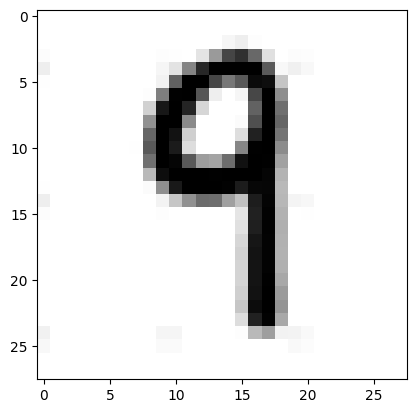

In [45]:

names = [
    "handwrittenTest/0.png",
    "handwrittenTest/1.png",
    "handwrittenTest/2.png",
    "handwrittenTest/3.png",
    "handwrittenTest/4.png",
    "handwrittenTest/5.png",
    "handwrittenTest/6.png",
    "handwrittenTest/7.png",
    "handwrittenTest/8.png",
    "handwrittenTest/9.png"
]

def test_model(name):
    imagen = kerasImg.load_img(name,target_size=(28,28))
    plt.imshow(imagen)
    imagen = kerasImg.img_to_array(imagen)
    imagen = imagen.reshape(1,28,28,3)
    resultado = modelo2Augmented.predict(imagen)
    print(resultado[0])
    maxValue = np.argmax(resultado[0])

    if maxValue == 0:
        print ("Es un número 0")
    if maxValue == 1:
        print ("Es un número 1")
    if maxValue == 2:
        print ("Es un número 2")
    if maxValue == 3:
        print ("Es un número 3")
    if maxValue == 4:
        print ("Es un número 4")
    if maxValue == 5:
        print ("Es un número 5")
    if maxValue == 6:
        print ("Es un número 6")
    if maxValue == 7:
        print ("Es un número 7")
    if maxValue == 8:
        print ("Es un número 8")
    if maxValue == 9:
        print ("Es un número 9")
        
    return maxValue

count = 0
for i, name in enumerate(names):
    print(f"Test {i+1}: numero {i}")
    value = test_model(name)

    if value == i:
        count += 1
        
print(f"El modelo acertó {count} de {len(names)} pruebas")